In [1]:
pip install opencv-python

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
import cv2 

In [3]:
import numpy as np

In [4]:
from matplotlib import pyplot as plt

In [5]:
image_file="C:\\Users\\param\\Downloads\\CSzyw.png"
img =cv2.imread(image_file)

In [6]:
#cv2.imshow("orginal image",img)
#cv2.waitKey(0)

In [7]:
#https://stackoverflow.com/questions/28816046/
#displaying-different-images-with-actual-size-in-matplotlib-subplot
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

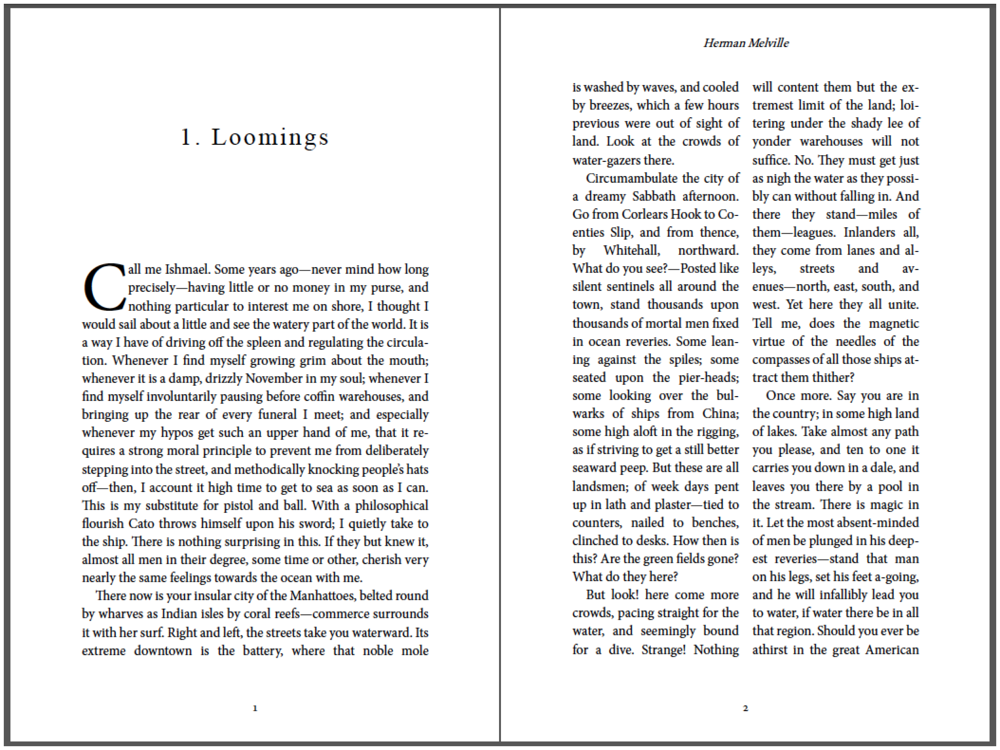

In [8]:
display(image_file)

## Inverted Images

In [9]:
inverted_image=cv2.bitwise_not(img)
cv2.imwrite("C:\\Users\\param\\Downloads\\inverted.jpg",inverted_image)

True

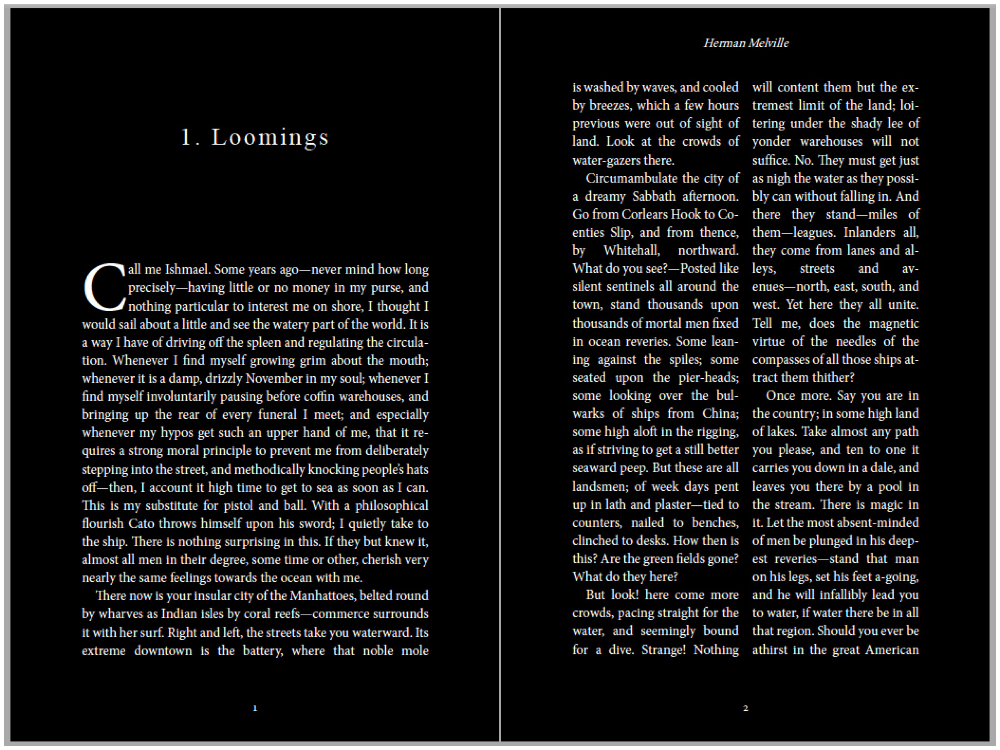

In [10]:
display("C:\\Users\\param\\Downloads\\inverted.jpg")

## Rescalling

## Binarization

In [11]:
# function help to do it
def grayscale(image):
    return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [12]:
gray_image=grayscale(img)
cv2.imwrite("C:\\Users\\param\\Downloads\\gray_image.jpg",gray_image)

True

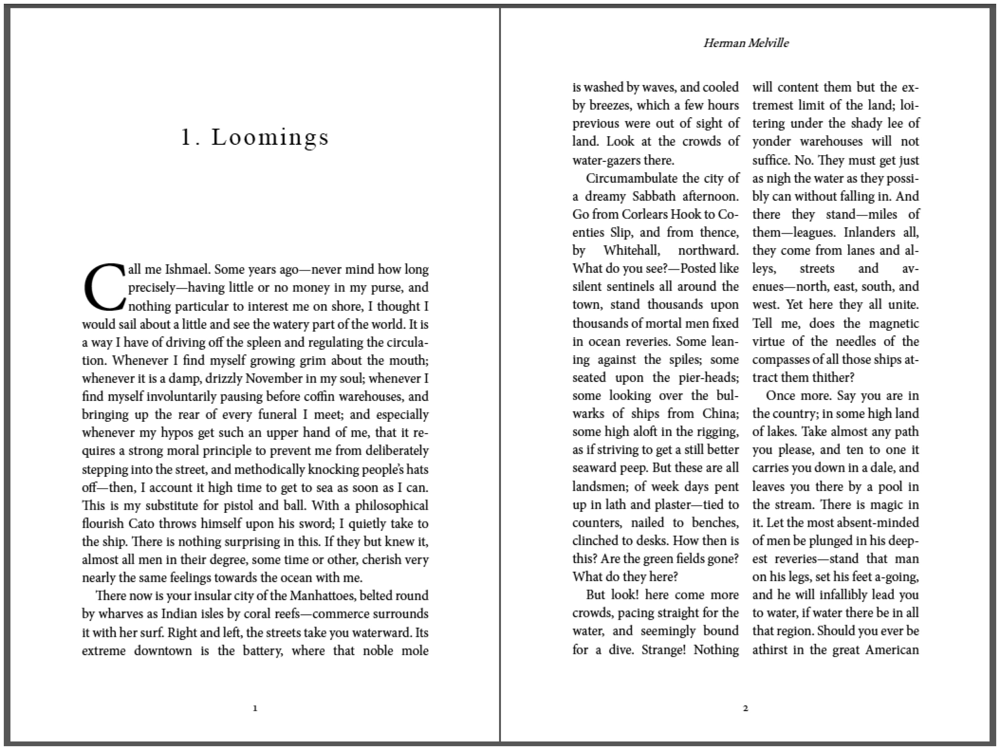

In [13]:
display("C:\\Users\\param\\Downloads\\gray_image.jpg")

In [14]:
thresh, im_bw=cv2.threshold(gray_image,200,230,cv2.THRESH_BINARY)
cv2.imwrite("C:\\Users\\param\\Downloads\\img_bw.jpg",im_bw)

True

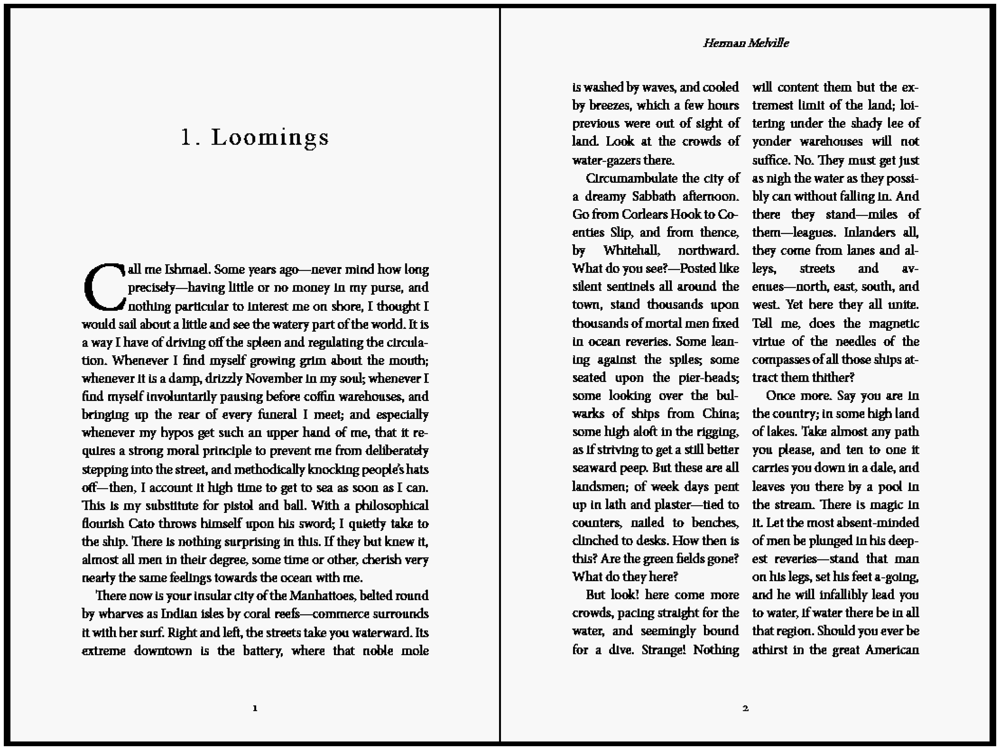

In [15]:
display("C:\\Users\\param\\Downloads\\img_bw.jpg")

## Noise remove

In [16]:
def noise_remover(image):
    kernel=np.ones((1,1),np.uint8)
    image=cv2.dilate(image,kernel,iterations=1)
    kernel=np.ones((1,1),np.uint8)
    image=cv2.erode(image,kernel,iterations=1)
    image=cv2.morphologyEx(image,cv2.MORPH_CLOSE,kernel)
    image=cv2.medianBlur(image,1)
    return(image)

In [17]:
no_noise=noise_remover(im_bw)
cv2.imwrite("C:\\Users\\param\\Downloads\\noise.jpg",no_noise)

True

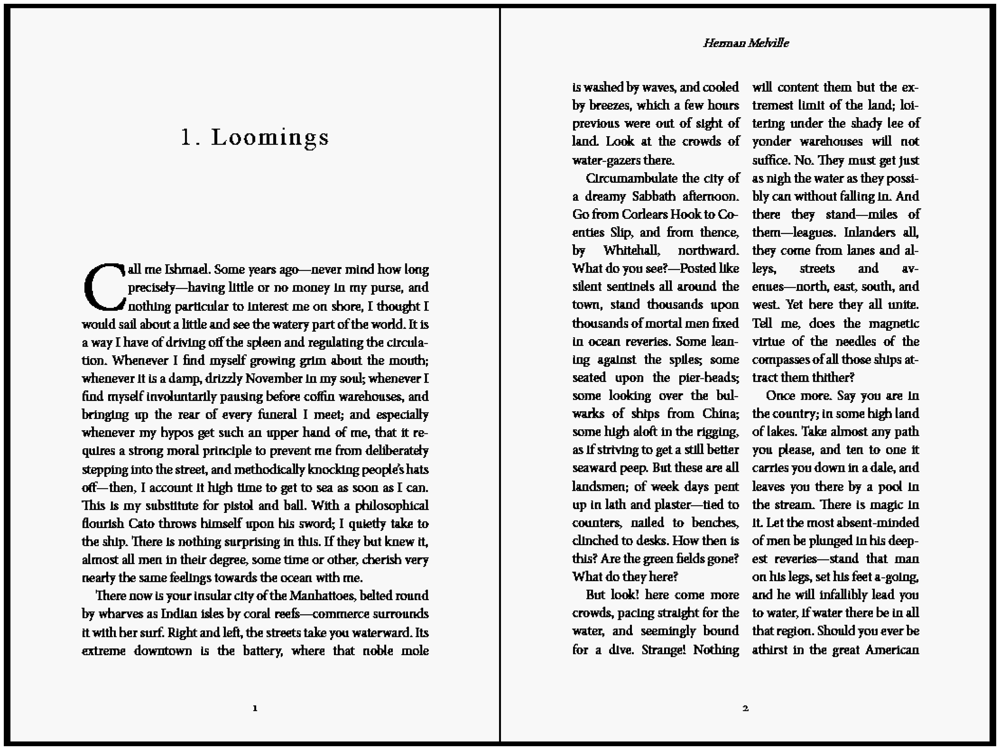

In [18]:
display("C:\\Users\\param\\Downloads\\noise.jpg")

## Dilation and Erosion

In [19]:
def thin_font(image):
    image=cv2.bitwise_not(image)
    kernel=np.ones((1,1),np.uint8)
    image=cv2.erode(image,kernel,iterations=1)
    image=cv2.bitwise_not(image)
    return (image)

In [20]:
erode_image=thin_font(no_noise)
cv2.imwrite("C:\\Users\\param\\Downloads\\erode_img.jpg",erode_image)

True

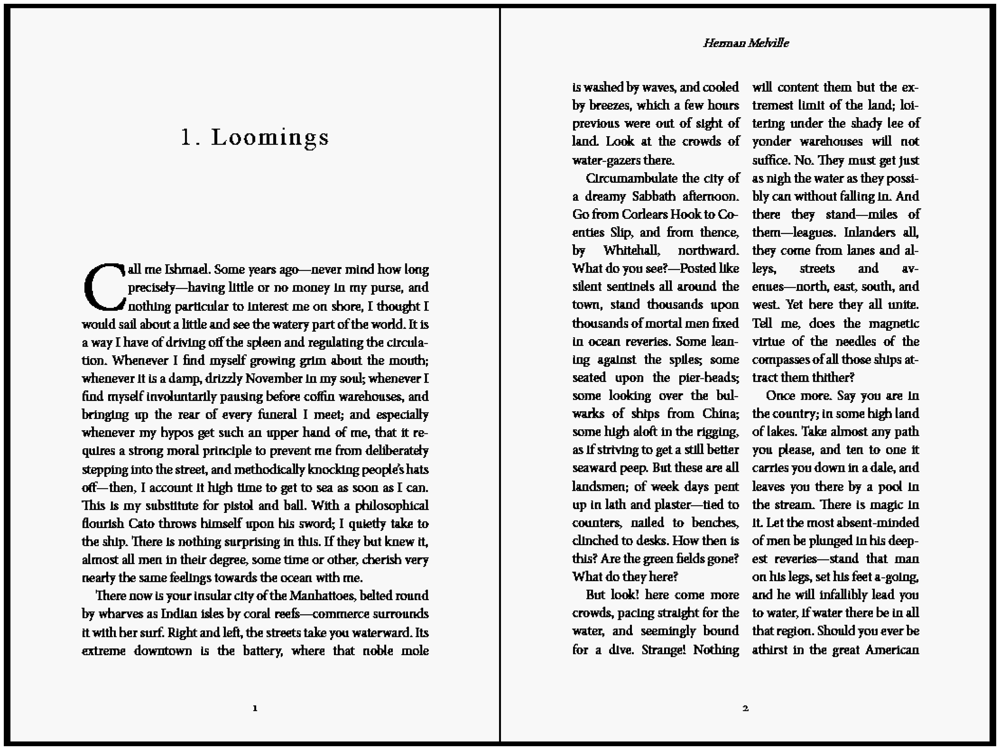

In [21]:
display("C:\\Users\\param\\Downloads\\erode_img.jpg")

In [22]:
def thick_font(image):
    image=cv2.bitwise_not(image)
    kernel=np.ones((2,2),np.uint8)
    image=cv2.dilate(image,kernel,iterations=1)
    image=cv2.bitwise_not(image)
    return (image)

In [23]:
dilate_img=thick_font(no_noise)
cv2.imwrite("C:\\Users\\param\\Downloads\\dilate_img.jpg",dilate_img)

True

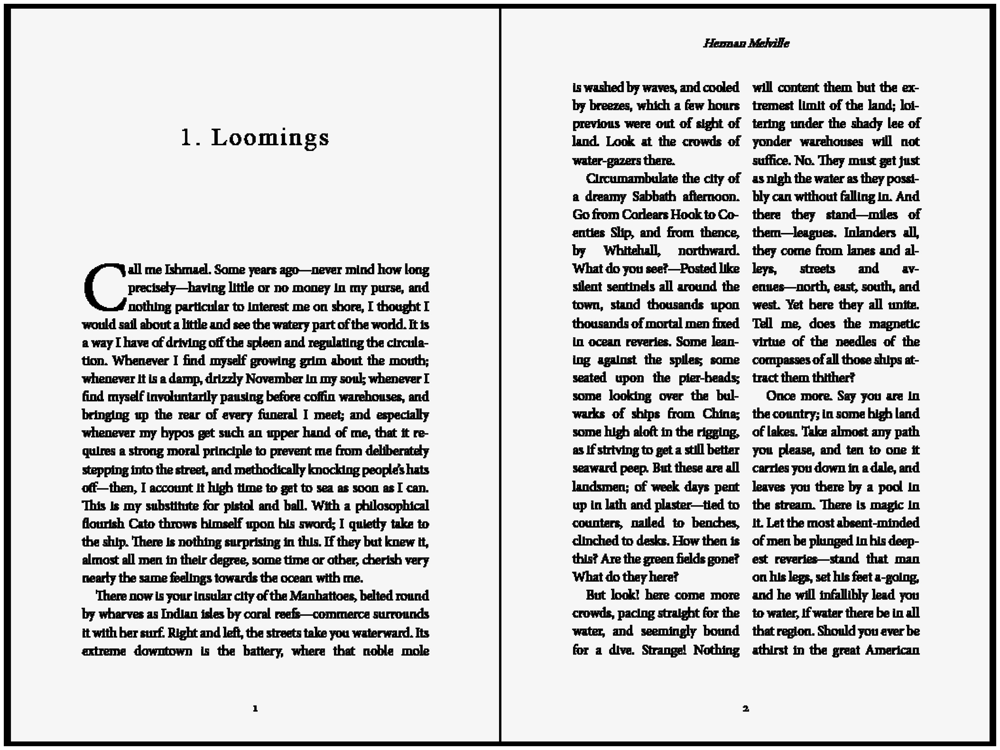

In [24]:
display("C:\\Users\\param\\Downloads\\dilate_img.jpg")

## Rotaion /Deskewing

In [25]:
new =cv2.imread("C:\\Users\\param\\Downloads\\dem02.png")

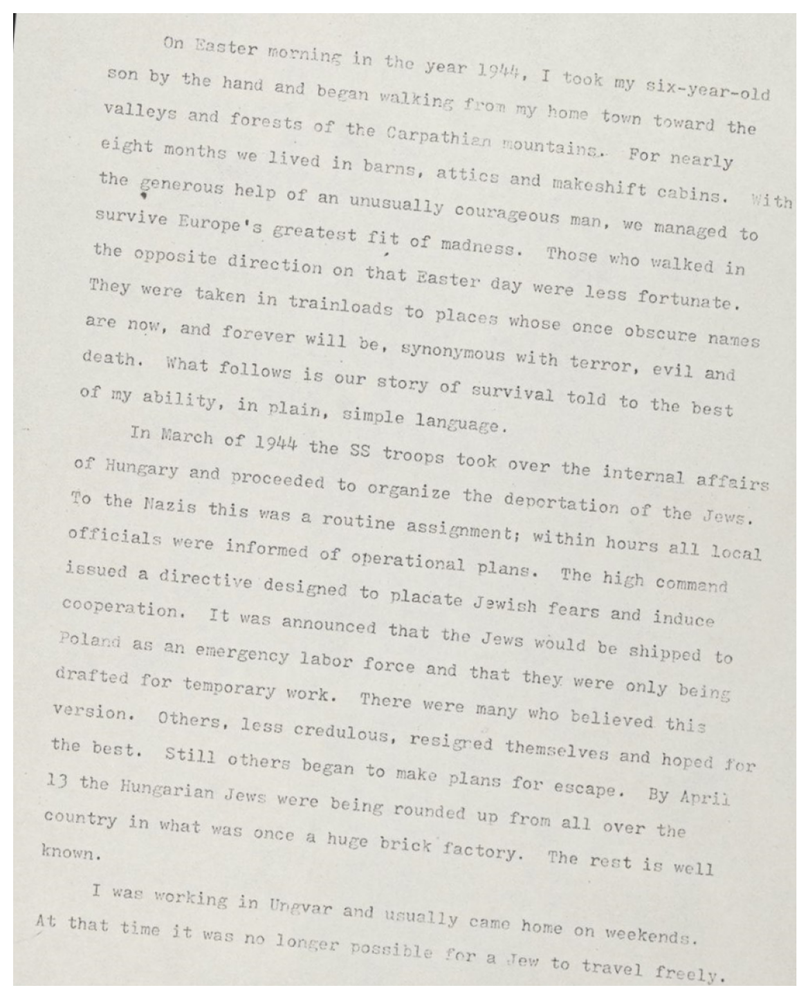

In [26]:
display("C:\\Users\\param\\Downloads\\dem02.png")

In [27]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage


In [28]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [29]:
fixed = deskew(new)
cv2.imwrite("C:\\Users\\param\\Downloads\\rotated_fixed.png", fixed)

28


True

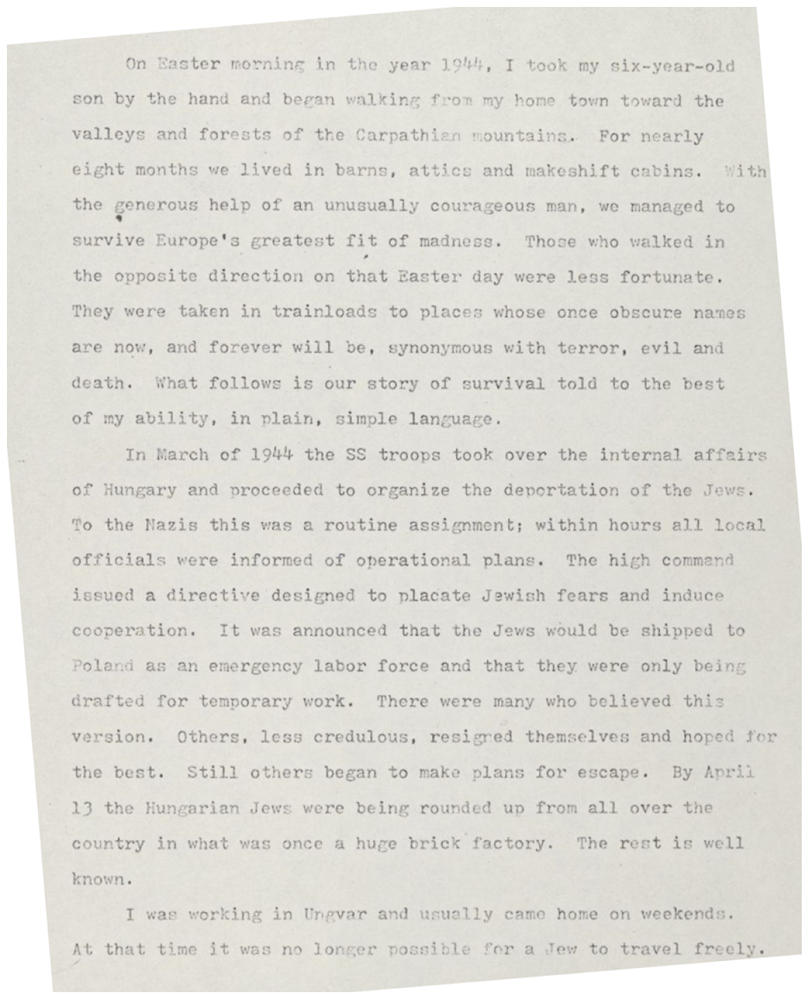

In [30]:
display("C:\\Users\\param\\Downloads\\rotated_fixed.png")

## Removing Borders

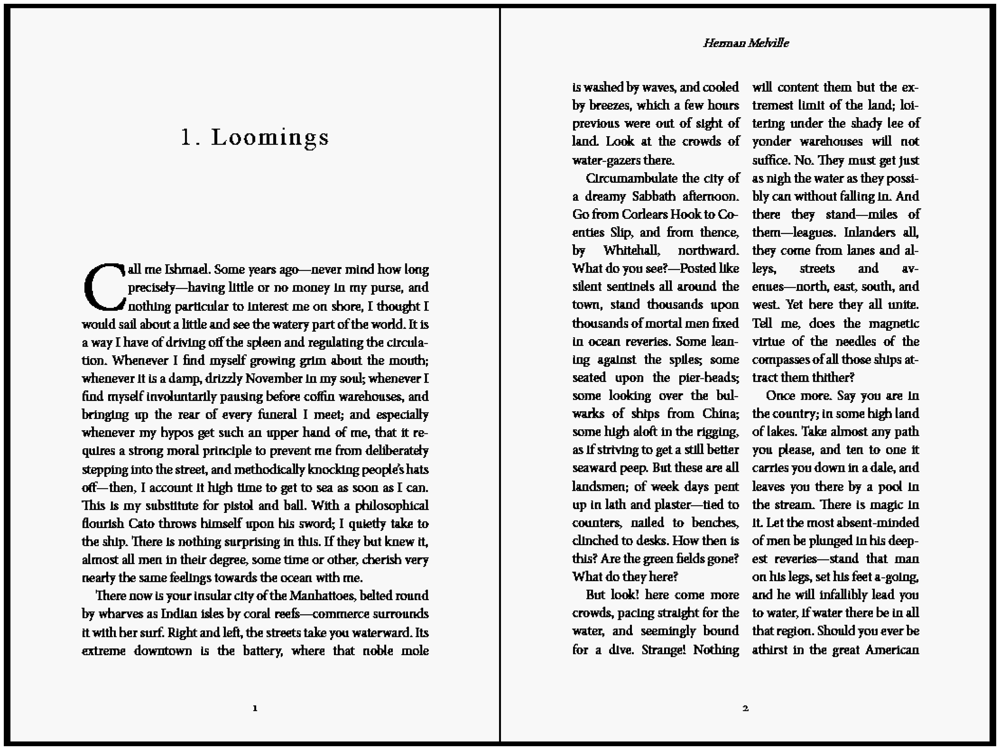

In [31]:
display("C:\\Users\\param\\Downloads\\noise.jpg")

In [32]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

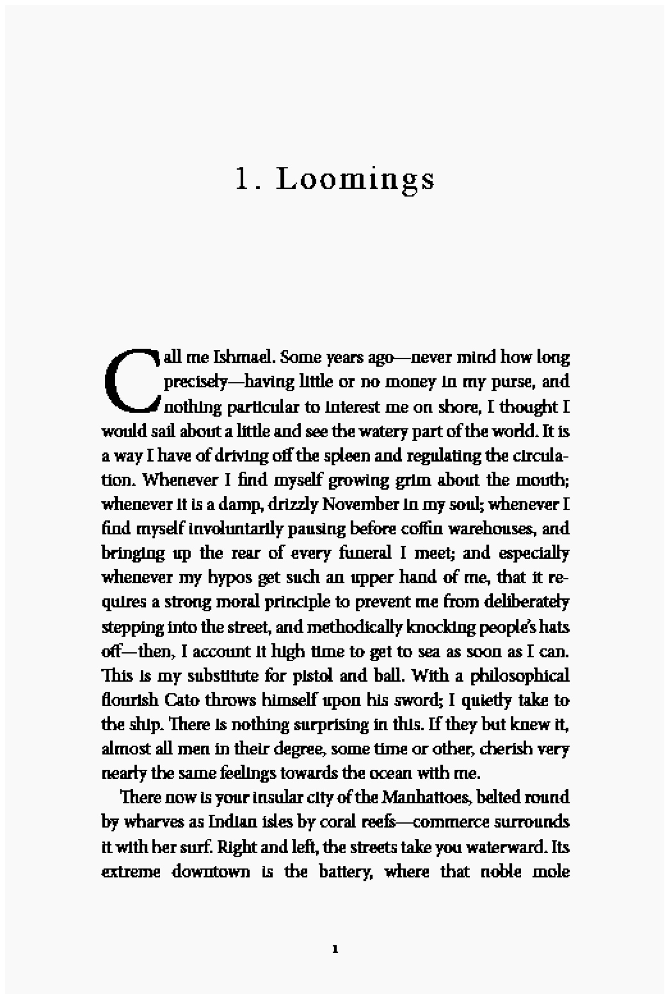

In [33]:
no_border=remove_borders(no_noise)
cv2.imwrite("C:\\Users\\param\\Downloads\\no_border.jpg",no_border)
display("C:\\Users\\param\\Downloads\\no_border.jpg")

In [34]:
from PIL import Image
import pytesseract

In [35]:
img_file="C:\\Users\\param\\Downloads\\hand.webp"
no_noise="C:\\Users\\param\\Downloads\\noise.jpg"

In [36]:
img1=Image.open(img_file)

In [37]:
ocr_result1=pytesseract.image_to_string(img1)

In [38]:
print(ocr_result1)

In [39]:
img=Image.open(no_noise)

In [40]:
ocr_result=pytesseract.image_to_string(img)

In [41]:
print(ocr_result)

1. Loomings

precisely—having little or no money In my purse, and
oothing particular to Loterest me on shore, [ thought I
would sail about a little and see the watery part of the world. It is
a way I have of driving off the spleen and regulating the circula-
tion. Whenever I find myself growing grim about the mouth;
whenever It is a damp, drizzly November Lo my soul; whenever [
find myself involuntarily pausing before coffin warehouses, and
bringing up the rear of every funeral I meet; and especially
whenever my hypos get such an upper hand of me, that it re-
quires a strong moral principle to prevent me from deliberately
stepping into the street, and methodically knocking people’s hats
off—then, I account It high time to get to sea as soon as I can.
This is my substitute for pistol and ball. With a philosophical
flourish Cato throws himself upon his sword; I quietly take to
the ship. There Is nothing surprising in this. If they but koew it,
almost all men in their degree, some time or